In [1]:
!rm -rf /content/grad_cam_result
!rm -rf /content/pcos_dataset
!rm -rf /content/runs
!rm -rf /content/sample_data
!rm -rf /content/yolo11n.pt
!rm -rf /content/yolo26n.pt


In [2]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import os, sys, subprocess
print("TF:", tf.__version__)
print("physical devices:", tf.config.list_physical_devices())
print("GPUs:", tf.config.list_physical_devices('GPU'))
print("Python exec:", sys.executable)

TF: 2.19.0
physical devices: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Python exec: /usr/bin/python3


In [5]:
try:
    print("TF version:", tf.__version__)
    print("TF built with CUDA:", tf.test.is_built_with_cuda())
    print("Physical GPUs:", tf.config.list_physical_devices('GPU'))
except Exception as e:
    print("Import TF error:", repr(e))

print("\nPip show tensorflow:")
!"{sys.executable}" -m pip show tensorflow

print("\nOutput nvidia-smi:")
!nvidia-smi

TF version: 2.19.0
TF built with CUDA: True
Physical GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

Pip show tensorflow:
Name: tensorflow
Version: 2.19.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.12/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, requests, setuptools, six, tensorboard, termcolor, typing-extensions, wrapt
Required-by: dopamine_rl, tensorflow-text, tensorflow_decision_forests, tf_keras

Output nvidia-smi:
Mon Mar  2 06:04:50 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+---------------------------------

In [6]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.notebook import tqdm
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, average_precision_score
from tabulate import tabulate
import seaborn as sns
import yaml
import shutil
from pathlib import Path
from PIL import Image, ImageEnhance
import albumentations as A
from collections import defaultdict
import torch

# Ultralytics YOLOv11
!pip install ultralytics
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator, colors

# For Google Colab
from google.colab import drive
from IPython.display import display, Image as IPImage
from PIL import Image, ImageDraw, ImageFont

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 28.8 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [7]:
main_path = "/content/drive/MyDrive/Tugas Akhir/dataset"
path='/content/pcos_dataset'
classes = ['Normal', 'PCOS']

class_mapping = {0 : 'Normal', 1 : 'PCOS'}
class_counts_test = {0 : 0, 1:0}
class_counts_train = {0 : 0, 1:0}
class_counts_val = {0 : 0, 1:0}

# ratio_test = 0.15
# ratio_val = 0.15
# ratio_train = 0.70

In [8]:
# def augmentation_pipeline():
#   return A.Compose([
#         A.HorizontalFlip(p=0.5),
#         A.ShiftScaleRotate(
#             shift_limit=0.1,
#             scale_limit=0.1,
#             rotate_limit=15,
#             border_mode=0,
#             p=0.5
#         ),

#         A.RandomBrightnessContrast(
#             brightness_limit=0.12,
#             contrast_limit=0.12,
#         ),

#         A.GaussNoise(
#             var_limit=(10, 50),
#             p=0.15
#         ),
#     ], bbox_params=A.BboxParams(format="yolo", label_fields=["class_labels"], min_visibility=0.3))

In [9]:
# def prepare_folder(base_path='/content/pcos_dataset'):
#   if os.path.exists(base_path):
#         shutil.rmtree(base_path)
#         shutil.rmtree("/content/grad_cam_result")
#         shutil.rmtree("/content/runs")

#   for split in ['train', 'val', 'test']:
#     os.makedirs(f"{base_path}/{split}/images", exist_ok=True)
#     os.makedirs(f"{base_path}/{split}/labels", exist_ok=True)

#   return base_path

def copy_train_val_test(base_path='/content/pcos_dataset', main_path = '/content/drive/MyDrive/Tugas Akhir/dataset'):
    if os.path.exists(base_path):
        shutil.rmtree(base_path)
        shutil.rmtree("/content/grad_cam_result")
        shutil.rmtree("/content/runs")

    for split in ['train', 'val', 'test']:
        src = os.path.join(main_path, split)
        dst = os.path.join(base_path, split)
        shutil.copytree(src, dst)
        print(f"Copied: {src} → {dst}")

# def collect_dataset(main_path, classes):
#   all_pairs = []

#   for class_name in classes:
#     img_dir = os.path.join(main_path, class_name, 'images')
#     bbox_dir = os.path.join(main_path, class_name, 'bbox')

#     if not os.path.exists(img_dir) or not os.path.exists(bbox_dir):
#       print("Tidak ditemukan file!")
#       continue

#     images = os.listdir(img_dir)
#     bbox = os.listdir(bbox_dir)

#     for img_name in images:
#        base_name = img_name.split(".")[0]

#        src_img = os.path.join(img_dir, img_name)
#        src_bbox = os.path.join(bbox_dir, base_name + "_mask.txt")

#        if os.path.exists(src_bbox):
#         all_pairs.append((src_img, src_bbox))
#        else:
#         print("Tidak ditemukan pair bbox!")
#         pass
#   return all_pairs

# def copy_files(data, split):
#     img_dir = os.path.join(path, split, 'images')
#     bbox_dir = os.path.join(path, split, 'labels')

#     for src_img, src_txt in tqdm(data):
#         img_name = os.path.basename(src_img)
#         txt_name = os.path.basename(src_txt)

#         shutil.copy(src_img, os.path.join(img_dir, img_name))
#         shutil.copy(src_txt, os.path.join(bbox_dir, txt_name))

# def split():
#   prepare_folder(path)

#   dataset = collect_dataset(main_path, classes)
#   total_files = len(dataset)

#   if total_files == 0:
#     print("Tidak ada file yang ditemukan dalam drive!")

#   class_dict = defaultdict(list)

#   for img, txt in dataset:
#       class_name = img.split(os.sep)[-3]
#       class_dict[class_name].append((img, txt))

#   train, val, test = [], [], []

#   for class_name, data in class_dict.items():
#         random.shuffle(data)

#         total = len(data)
#         train_end = int(total * ratio_train)
#         val_end = train_end + int(total * ratio_val)

#         train += data[:train_end]
#         val   += data[train_end:val_end]
#         test  += data[val_end:]

#         print(
#             f"{class_name}: total={total}, "
#             f"train={len(data[:train_end])}, "
#             f"val={len(data[train_end:val_end])}, "
#             f"test={len(data[val_end:])}"
#         )

#         if class_name == "Normal":
#           id = 0
#         else:
#           id = 1

#         class_counts_test[id] = len(data[val_end:])
#         class_counts_train[id] = len(data[:train_end])
#         class_counts_val[id] = len(data[train_end:val_end])


  # random.shuffle(train)
  # random.shuffle(val)
  # random.shuffle(test)

  # print("Pembagian data train, test, val")
  # print(f"Train : {len(train)}")
  # print(f"Test : {len(test)}")
  # print(f"Val : {len(val)}")

  # copy_files(train, 'train')
  # copy_files(test, 'test')
  # copy_files(val, 'val')

In [10]:
print("Prepare Dataset")
copy_train_val_test()

Prepare Dataset
Copied: /content/drive/MyDrive/Tugas Akhir/dataset/train → /content/pcos_dataset/train
Copied: /content/drive/MyDrive/Tugas Akhir/dataset/val → /content/pcos_dataset/val
Copied: /content/drive/MyDrive/Tugas Akhir/dataset/test → /content/pcos_dataset/test


In [11]:
print(class_mapping)

{0: 'Normal', 1: 'PCOS'}


In [12]:
def plot_distribution():
  cats = ['Train', 'Validation', 'Test']
  normal_count = [0,0,0]
  pcos_count = [0,0,0]
  all_dir = os.listdir(path)

  for split in all_dir:
    bbox_dir = os.path.join(path, split, 'labels')

    normal = 0
    pcos = 0

    for bbox in os.listdir(bbox_dir):
      with open(os.path.join(bbox_dir, bbox), "r") as f:
        for line in f:
          line = line.strip()
          if not line:
            continue

          class_id = int(line.split()[0])

          if class_id == 0:
              normal +=1
          else:
              pcos +=1

      if split == 'train':
        normal_count[0] = normal
        pcos_count[0] = pcos
      elif split == 'val':
        normal_count[1] = normal
        pcos_count[1] = pcos
      elif split == 'test':
        normal_count[2] = normal
        pcos_count[2] = pcos

  # Bar width and x locations
  w, x = 0.4, np.arange(len(cats))

  fig, ax = plt.subplots()
  ax.bar(x - w/2, normal_count, width=w, label='Normal')
  ax.bar(x + w/2, pcos_count, width=w, label='PCOS')

  ax.set_xticks(x)
  ax.set_xticklabels(cats)
  ax.set_ylabel('Values')
  ax.set_title('Distribusi Kelas')
  ax.legend()

  plt.show()

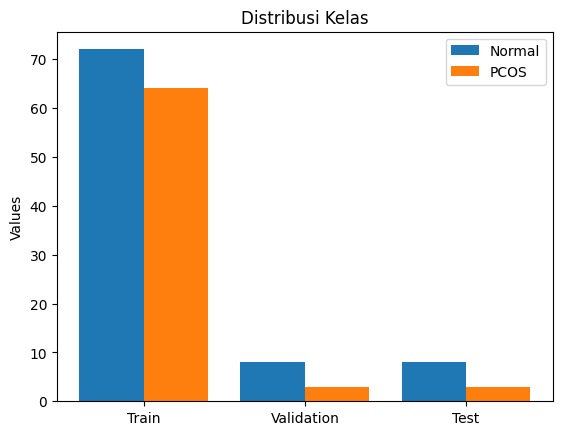

In [13]:
plot_distribution()

In [16]:
def visualize_dataset(img_dir, labels_dir, num, title):
  image_files = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]
  sample_files = random.sample(image_files, min(num, len(image_files)))

  cols = 3
  rows = (num + cols - 1) // cols
  fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
  axes = axes.flatten() if num > 1 else [axes]

  colors = {0 : (255, 192, 203), 1 : (255,255,0)}

  for idx, img_file in enumerate(sample_files):
    img_path = os.path.join(img_dir, img_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    label_file = img_file.split(".")[0] + ".txt"
    label_path = os.path.join(labels_dir, label_file)

    if os.path.exists(label_path):
        with open(label_path, 'r', encoding='utf-8-sig') as f:
            lines = f.readlines()

        for line in lines:
            if line.strip():
                try:
                    parts = line.strip().replace('\ufeff', '').split()
                    class_id = int(parts[0])
                    x_center = float(parts[1])
                    y_center = float(parts[2])
                    bbox_width = float(parts[3])
                    bbox_height = float(parts[4])

                    x1 = int((x_center - bbox_width/2) * w)
                    y1 = int((y_center - bbox_height/2) * h)
                    x2 = int((x_center + bbox_width/2) * w)
                    y2 = int((y_center + bbox_height/2) * h)

                    color = colors.get(class_id, (255, 255, 255))
                    cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

                    label_text = class_mapping.get(class_id, f"Class {class_id}")
                    cv2.putText(img, label_text, (x1, y1-5),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
                except:
                    continue

    axes[idx].imshow(img)
    axes[idx].set_title(f'{img_file}')
    axes[idx].axis('off')

  for idx in range(num, len(axes)):
    axes[idx].axis('off')

  plt.suptitle(title, fontsize=16)
  plt.tight_layout()
  plt.show()

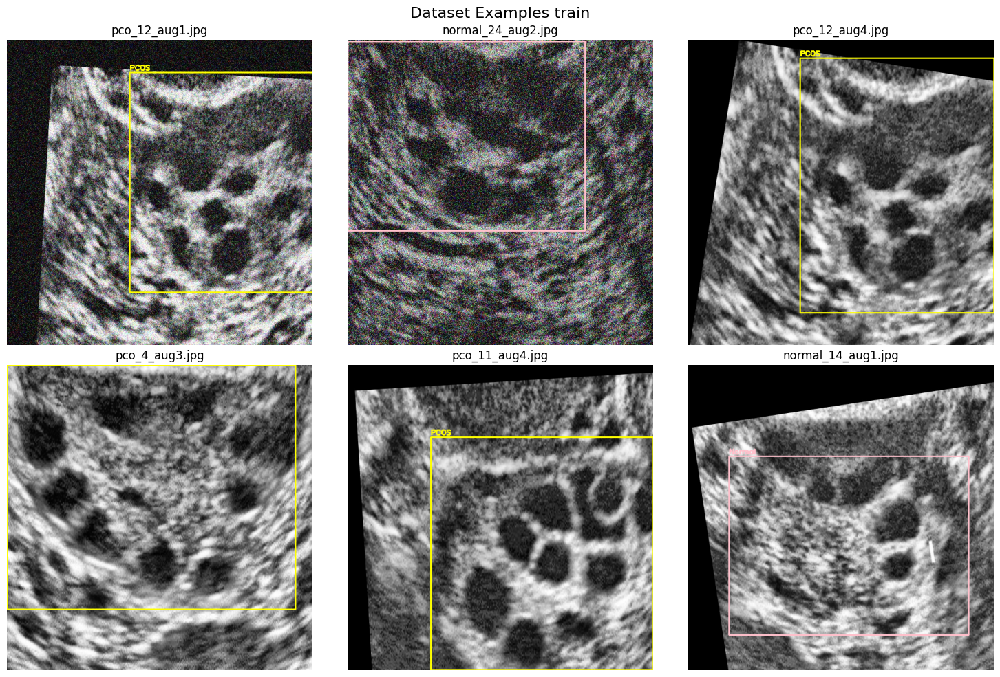

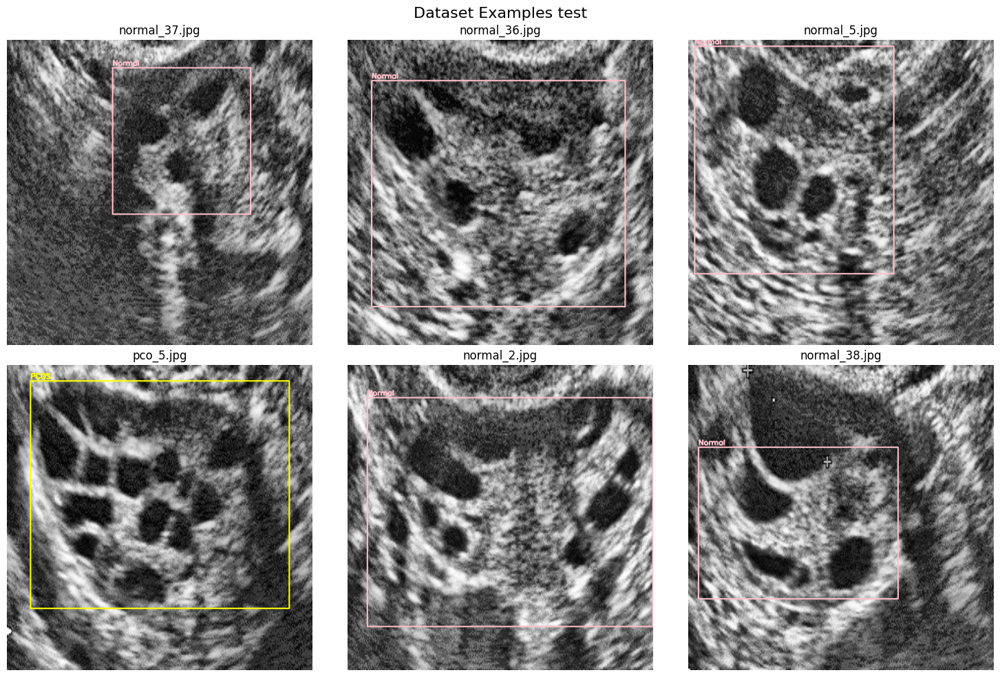

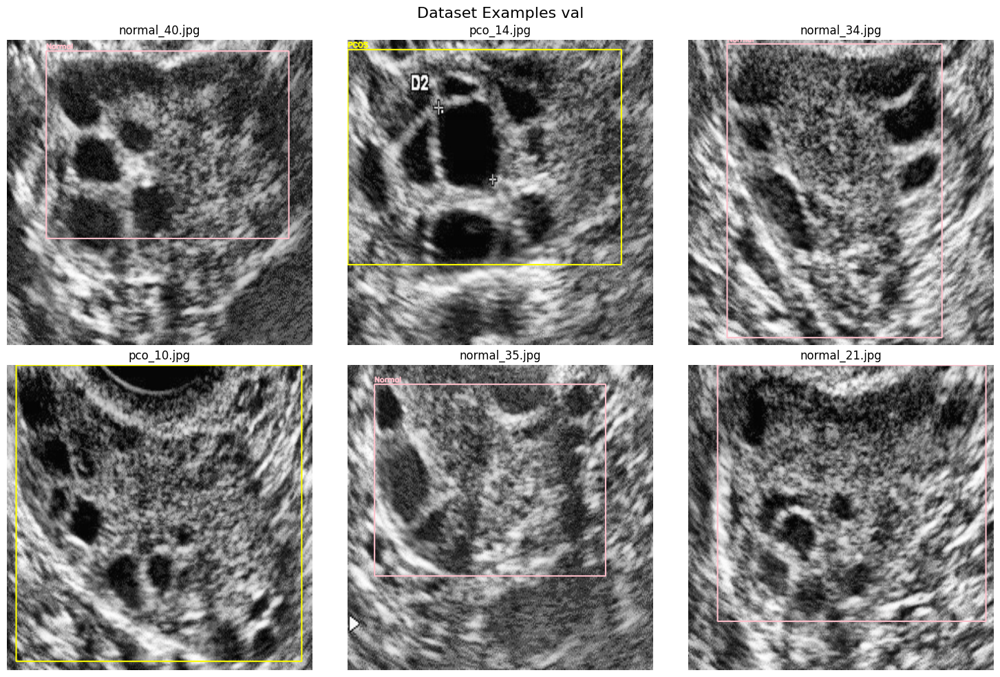

In [17]:
main = os.listdir(path)

for split in main:
  img_dir = os.path.join(path, split, 'images')
  labels_dir = os.path.join(path, split, 'labels')
  visualize_dataset(img_dir, labels_dir, 6, title = f"Dataset Examples {split}")

In [ ]:
# def rename_labels(labels_dir):
#   for name in os.listdir(labels_dir):
#     new_name = name.split("_mask")[0] +".txt"
#     os.rename(os.path.join(labels_dir, name), os.path.join(labels_dir, new_name))

In [ ]:
# rename_labels(os.path.join(path, 'train', 'labels'))
# rename_labels(os.path.join(path, 'test', 'labels'))
# rename_labels(os.path.join(path, 'val', 'labels'))

In [18]:
data_yaml = {
    'path' : path,
    'train' : 'train/images',
    'val' : 'val/images',
    'test' : 'test/images',
    'nc' : 2,
    'names' : list(class_mapping.values())
}

yaml_path = f'{path}/data.yaml'
with open(yaml_path, 'w') as f:
  yaml.dump(data_yaml, f)

In [19]:
model = YOLO("yolo11n.pt")

In [20]:
results = model.train(
    data=yaml_path,
    epochs=100,
    imgsz=640,
    batch=16,
    patience=20,
    save=True,
    device=0,
    project='pcos_detection',
    name='yolov11_pcos',
    exist_ok=True,
    pretrained=True,

    optimizer='AdamW',
    lr0=0.0003,
    weight_decay=0.0005,

    warmup_epochs=5,
    warmup_momentum=0.9,
    warmup_bias_lr=0.05,

    box=7.0,
    cls=1.5,
    dfl=1.0,

    degrees=15.0,
    translate=0.1,
    scale=0.10,
    shear=0.0,
    perspective=0.0,
    flipud=0.0,
    fliplr=0.5,

    hsv_h=0.005,
    hsv_s=0.12,
    hsv_v=0.12,

    mosaic=0.5,
    mixup=0.0,
    erasing=0.05,

    auto_augment='none',

    crop_fraction=1.0,

    verbose=True,
)

WARNING ⚠️ 'crop_fraction' is deprecated and will be removed in the future.
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=none, batch=16, bgr=0.0, box=7.0, cache=False, cfg=None, classes=None, close_mosaic=10, cls=1.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/pcos_dataset/data.yaml, degrees=15.0, deterministic=True, device=0, dfl=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.05, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.005, hsv_s=0.12, hsv_v=0.12, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0003, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=0.5, multi_scale=0.0, name=yolov11_pcos, nbs=64, nms=False, opset=N

In [21]:
metrics = model.val(data=yaml_path)

Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n summary (fused): 101 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2958.5±806.1 MB/s, size: 158.4 KB)
val: Scanning /content/pcos_dataset/val/labels.cache... 11 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 11/11 6.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 3.5it/s 0.3s
                   all         11         11      0.718      0.728      0.846      0.435
                Normal          8          8      0.435          1      0.945      0.465
                  PCOS          3          3          1      0.456      0.747      0.405
Speed: 1.5ms preprocess, 11.4ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /content/runs/detect/val


In [22]:
test_metrics = model.val(data=yaml_path, split='test')

Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2596.2±888.9 MB/s, size: 160.8 KB)
val: Scanning /content/pcos_dataset/test/labels... 11 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 11/11 2.4Kit/s 0.0s
val: New cache created: /content/pcos_dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 2.8it/s 0.4s
                   all         11         11      0.686      0.725      0.717      0.373
                Normal          8          8      0.371      0.875      0.703      0.343
                  PCOS          3          3          1      0.574      0.731      0.403
Speed: 1.5ms preprocess, 5.7ms inference, 0.0ms loss, 3.3ms postprocess per image
Results saved to /content/runs/detect/val2


In [23]:
def plot_results(path='/content/runs/detect/pcos_detection/yolov11_pcos'):
  result = os.path.join(path, 'results.csv')

  df = pd.read_csv(result)
  fig, axes = plt.subplots(2,2, figsize=(20,10))
  # Box Loss
  axes[0, 0].plot(df['train/box_loss'], label='Train')
  axes[0, 0].plot(df['val/box_loss'], label='Validation')
  axes[0, 0].set_title('Box Loss')
  axes[0, 0].set_xlabel('Epoch')
  axes[0, 0].set_ylabel('Loss')
  axes[0, 0].legend()
  axes[0, 0].grid(True)

  # Class Loss
  axes[0, 1].plot(df['train/cls_loss'], label='Train')
  axes[0, 1].plot(df['val/cls_loss'], label='Validation')
  axes[0, 1].set_title('Classification Loss')
  axes[0, 1].set_xlabel('Epoch')
  axes[0, 1].set_ylabel('Loss')
  axes[0, 1].legend()
  axes[0, 1].grid(True)

  # mAP50
  axes[1, 0].plot(df['metrics/mAP50(B)'], label='mAP50')
  axes[1, 0].set_title('mAP50')
  axes[1, 0].set_xlabel('Epoch')
  axes[1, 0].set_ylabel('mAP')
  axes[1, 0].legend()
  axes[1, 0].grid(True)

  # mAP50-95
  axes[1, 1].plot(df['metrics/mAP50-95(B)'], label='mAP50-95')
  axes[1, 1].set_title('mAP50-95')
  axes[1, 1].set_xlabel('Epoch')
  axes[1, 1].set_ylabel('mAP')
  axes[1, 1].legend()
  axes[1, 1].grid(True)

  plt.tight_layout()
  plt.show()

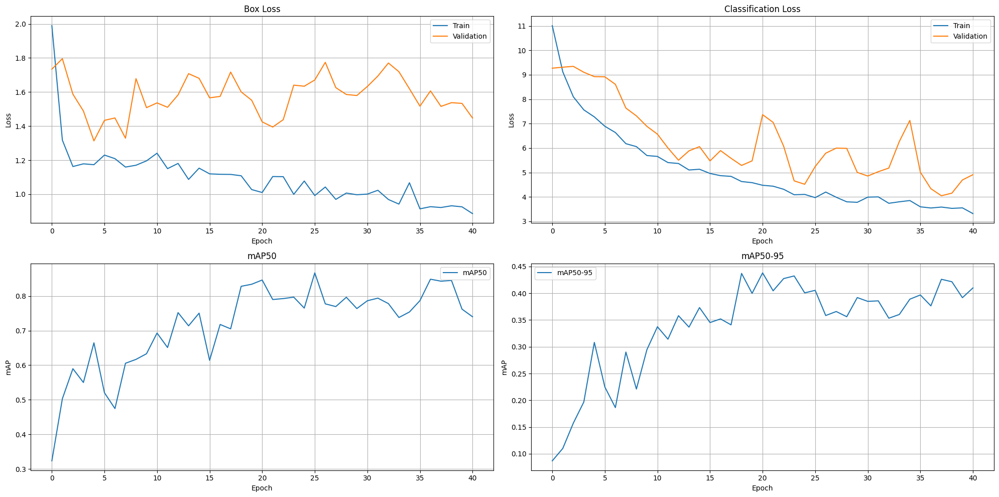

In [24]:
plot_results()

In [25]:
def visualize_results(model, image_path):
  results = model(image_path)

  for res in results:
    im = Image.fromarray(res.plot()[..., ::-1])
    display(im)


Prediction Result for normal_37.jpg:

image 1/1 /content/pcos_dataset/test/images/normal_37.jpg: 640x640 2 Normals, 7.9ms
Speed: 1.5ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


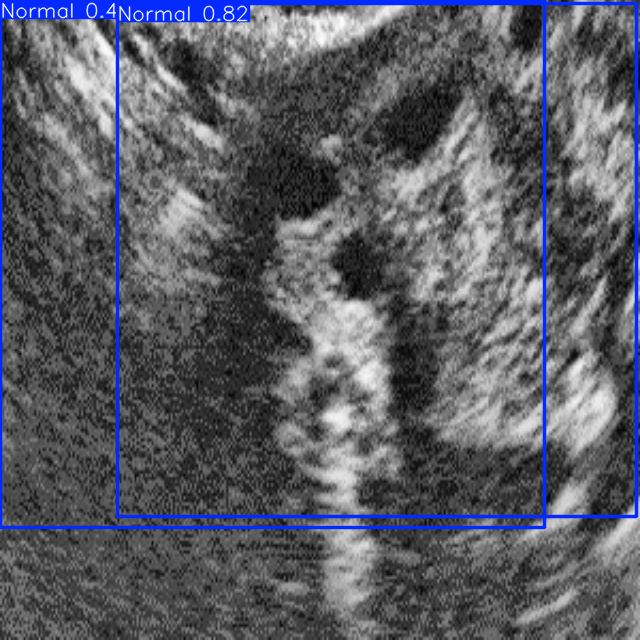


Prediction Result for normal_38.jpg:

image 1/1 /content/pcos_dataset/test/images/normal_38.jpg: 640x640 2 Normals, 13.0ms
Speed: 1.9ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


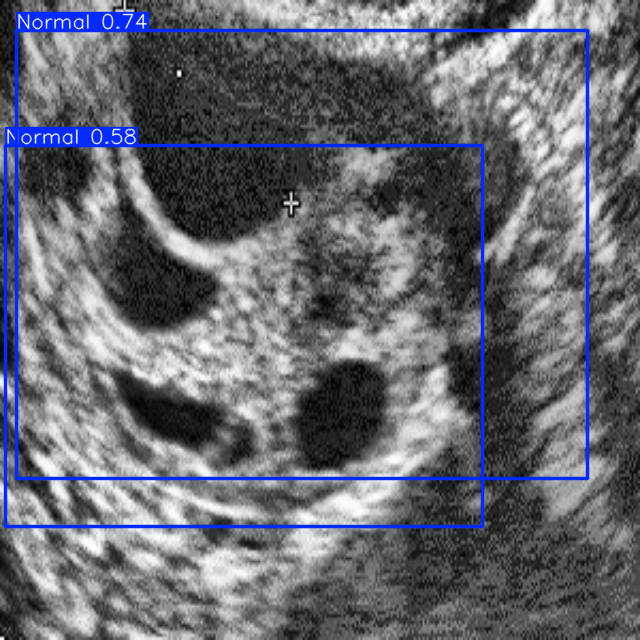


Prediction Result for normal_1.jpg:

image 1/1 /content/pcos_dataset/test/images/normal_1.jpg: 640x640 1 Normal, 12.2ms
Speed: 2.0ms preprocess, 12.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


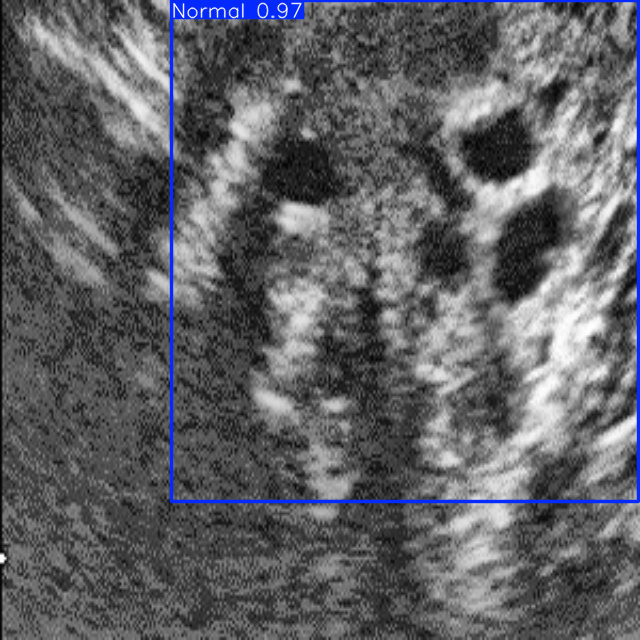


Prediction Result for pco_1.jpg:

image 1/1 /content/pcos_dataset/test/images/pco_1.jpg: 640x640 2 Normals, 1 PCOS, 12.4ms
Speed: 2.0ms preprocess, 12.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


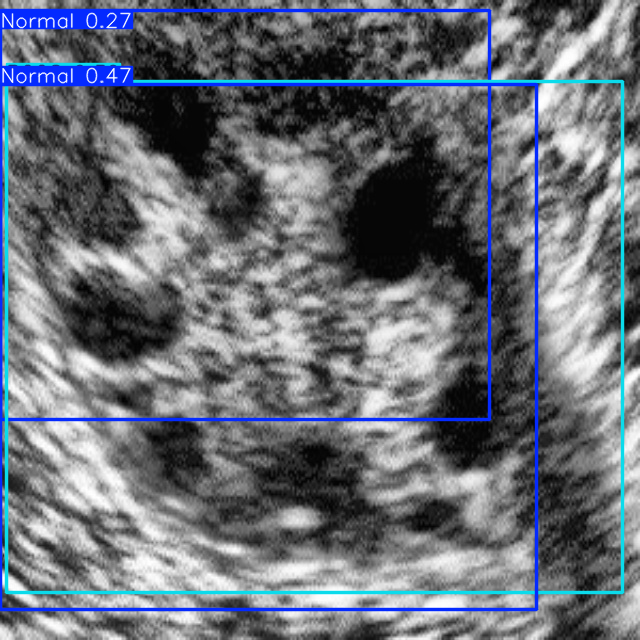


Prediction Result for normal_3.jpg:

image 1/1 /content/pcos_dataset/test/images/normal_3.jpg: 640x640 1 Normal, 11.5ms
Speed: 2.2ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


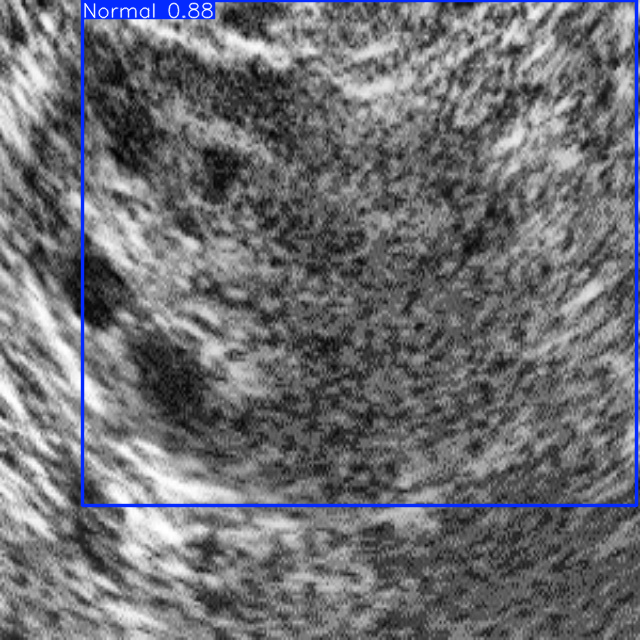


Prediction Result for normal_5.jpg:

image 1/1 /content/pcos_dataset/test/images/normal_5.jpg: 640x640 1 Normal, 13.8ms
Speed: 2.1ms preprocess, 13.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


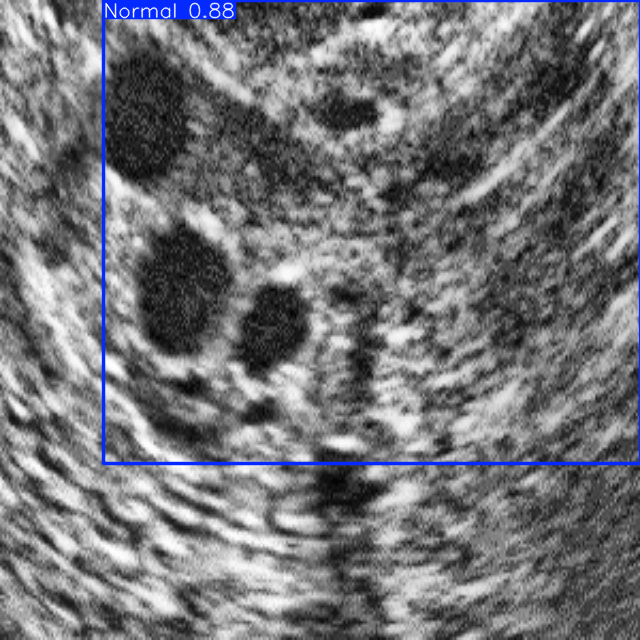

In [26]:
result_test_img = os.listdir(os.path.join(path, 'test', 'images'))[:6]
for name in result_test_img:
  print(f'\nPrediction Result for {name}:')
  visualize_results(model, os.path.join(path, 'test', 'images', name))

In [29]:
def evaluate_yolo(model, data_yaml_path, split, class_mapping):
    print(f'\nEvaluasi untuk: {split.upper()}...')

    metrics = model.val(data=data_yaml_path, split=split, verbose=False)

    if hasattr(metrics, 'confusion_matrix'):
        matrix = metrics.confusion_matrix.matrix
        num_classes = len(class_mapping)
        supports = matrix.sum(1)[:num_classes]
    else:
        supports = [0] * len(class_mapping)

    print('---------------------------------------------------------------------')
    headers = ['Class', 'Precision', 'Recall', 'F1-Score', 'Support', 'mAP50']
    rows = []

    total_support = sum(supports)
    weighted_p, weighted_r, weighted_f1 = 0, 0, 0

    for i in range(len(class_mapping)):
        if i < len(metrics.box.p):
            p = metrics.box.p[i]
            r = metrics.box.r[i]

            f1 = 2 * p * r / (p + r + 1e-10)
            ap = metrics.box.ap50[i]
            support = int(supports[i])

            rows.append([
                class_mapping[i],
                f"{p:.3f}",
                f"{r:.3f}",
                f"{f1:.3f}",
                str(support),
                f"{ap:.3f}"
            ])

            weighted_p += p * support
            weighted_r += r * support
            weighted_f1 += f1 * support
        else:
             rows.append([class_mapping[i], '0.00', '0.00', '0.00', '0', '0.00'])

    rows.append(['-'*10] * 6)

    accuracy = 0
    if hasattr(metrics, 'confusion_matrix'):
        cm = metrics.confusion_matrix.matrix
        n = len(class_mapping)
        correct = np.diag(cm[:n, :n]).sum()
        total = cm.sum()
        accuracy = correct / total if total > 0 else 0

    rows.append([
        'Accuracy', '', '', f"{accuracy:.3f}", str(int(total_support)), ''
    ])

    macro_p = metrics.box.mp
    macro_r = metrics.box.mr
    macro_map = metrics.box.map50

    rows.append([
        'Macro Avg', f"{macro_p:.3f}", f"{macro_r:.3f}", '-', str(int(total_support)), f"{macro_map:.3f}"
    ])

    if total_support > 0:
        weighted_p /= total_support
        weighted_r /= total_support
        weighted_f1 /= total_support

    rows.append([
        'Weighted Avg', f"{weighted_p:.3f}", f"{weighted_r:.3f}", f"{weighted_f1:.3f}", str(int(total_support)), ''
    ])

    print(tabulate(rows, headers=headers, tablefmt='simple'))
    return metrics

def plot_confusion_matrix(metrics, class_mapping, split):
    if hasattr(metrics, 'confusion_matrix') and metrics.confusion_matrix is not None:
        cm = metrics.confusion_matrix.matrix

        n = len(class_mapping)
        cm = cm[:n, :n]

        plt.figure(figsize=(8, 6))
        class_names = [class_mapping[i] for i in range(n)]

        sns.heatmap(cm, annot=True, fmt='.0f', cmap='Blues',
                    xticklabels=class_names, yticklabels=class_names)

        plt.title(f"Confusion Matrix ({split.upper()})", fontsize=14)
        plt.xlabel('Predicted', fontsize=12)
        plt.ylabel('True / Ground Truth', fontsize=12)
        plt.tight_layout()
        plt.show()

Evaluate Model: 

Evaluasi untuk: VAL...
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2163.1±570.0 MB/s, size: 155.6 KB)
val: Scanning /content/pcos_dataset/val/labels.cache... 11 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 11/11 4.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.6it/s 0.6s
                   all         11         11      0.718      0.728      0.846      0.435
Speed: 1.9ms preprocess, 6.3ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to /content/runs/detect/val5
---------------------------------------------------------------------
Class         Precision    Recall      F1-Score    Support     mAP50
------------  -----------  ----------  ----------  ----------  ----------
Normal        0.435        1.000       0.607       15          0.945
PCOS          1.000        0.456       

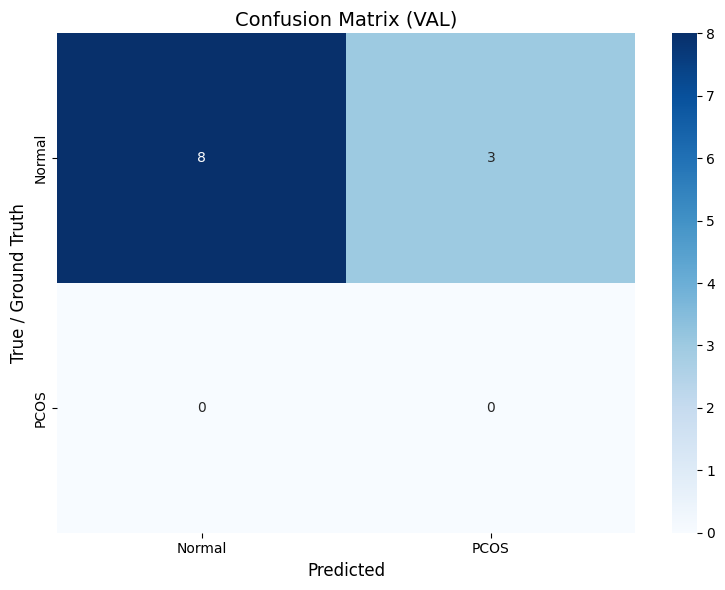


Evaluasi untuk: TEST...
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2819.3±888.6 MB/s, size: 157.7 KB)
val: Scanning /content/pcos_dataset/test/labels.cache... 11 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 11/11 3.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 3.3it/s 0.3s
                   all         11         11      0.686      0.725      0.717      0.373
Speed: 1.4ms preprocess, 6.2ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to /content/runs/detect/val6
---------------------------------------------------------------------
Class         Precision    Recall      F1-Score    Support     mAP50
------------  -----------  ----------  ----------  ----------  ----------
Normal        0.371        0.875       0.521       16          0.703
PCOS          1.000        0.574       0.729       1  

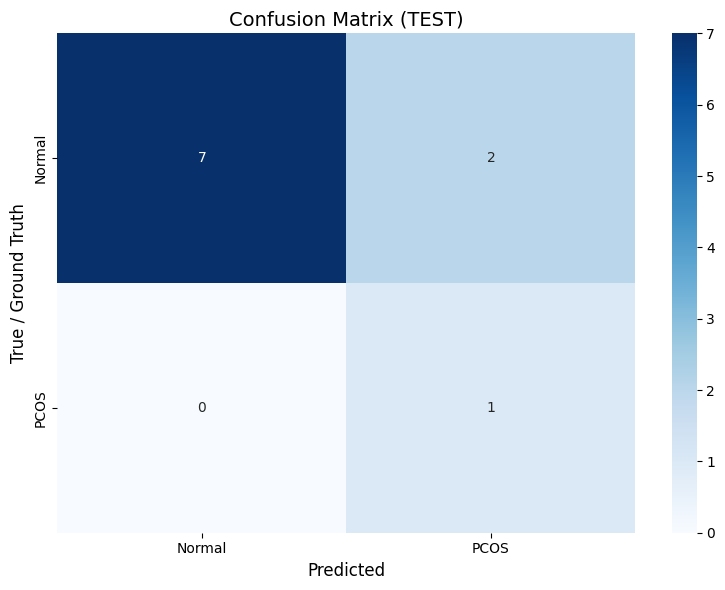

In [30]:
print("Evaluate Model: ")
for split in ['val', 'test']:
    metrics = evaluate_yolo(model, yaml_path, split, class_mapping)
    plot_confusion_matrix(metrics, class_mapping, split)

In [54]:
!rm -rf /content/grad_cam_result

Total gambar ditemukan : 11
Sedang memproses Grad-CAM (Uniform Style)...


  0%|          | 0/11 [00:00<?, ?it/s]/tmp/ipython-input-264/853415889.py:98: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
  score.backward()
100%|██████████| 11/11 [00:04<00:00,  2.42it/s]


Selesai. Folder output: grad_cam_result


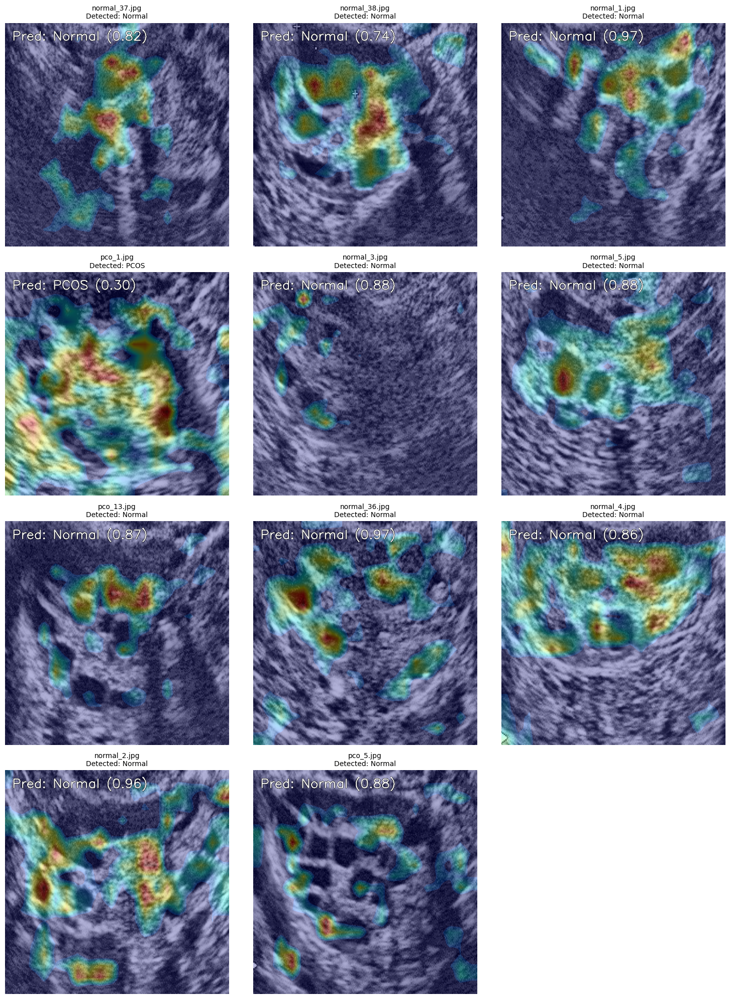

In [ ]:
import os
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import random
from ultralytics import YOLO
from tqdm import tqdm

THRESHOLD = 0.20
TOPK = 50

test_img_dir = os.path.join(path, 'test', 'images')
model = YOLO("/content/runs/detect/pcos_detection/yolov11_pcos/weights/best.pt")
model.model.float()
model.model.eval()

# Class Mapping
class_mapping = {0: 'Normal', 1: 'PCOS'}

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)

    def generate(self):
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.activations, dim=1)
        cam = torch.relu(cam)
        cam = cam.squeeze().cpu().numpy()
        cam = cv2.resize(cam, (640, 640))
        cam = (cam - cam.min()) / (cam.max() + 1e-8)
        return cam

target_layer = model.model.model[-3]
gradcam = GradCAM(model.model, target_layer)

def preprocess_image(img):
    img_tensor = torch.from_numpy(img).permute(2, 0, 1).float()
    img_tensor /= 255.0
    img_tensor = img_tensor.unsqueeze(0)
    img_tensor.requires_grad_(True)
    return img_tensor

def run_gradcam(image_path):
    img = cv2.imread(image_path)
    if img is None:
        return None, "Error"

    img = cv2.resize(img, (640, 640))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_tensor = preprocess_image(img_rgb)

    preds = model.model(img_tensor)
    output = preds[0]
    raw_logits = output[0, 4:, :]

    conf_normal = float(raw_logits[0, :].max().detach())
    conf_pcos   = float(raw_logits[1, :].max().detach())

    PCOS_THRESHOLD = 0.15
    if conf_pcos >= PCOS_THRESHOLD:
        pred_id    = 1
        confidence = conf_pcos
    else:
        pred_id    = 0
        confidence = conf_normal

    pred_label = class_mapping.get(pred_id, "Unknown")

    target_logits = raw_logits[pred_id, :]
    topk_values, _ = torch.topk(target_logits, k=TOPK)
    score = topk_values.sum()

    model.model.zero_grad()
    score.backward()

    cam = gradcam.generate()
    cam[cam < THRESHOLD] = 0

    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img, 0.7, heatmap, 0.3, 0)
    result_img = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    text = f"Pred: {pred_label} ({confidence:.2f})"
    cv2.putText(result_img, text, (20, 50),
                cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 0, 0), 4)
    cv2.putText(result_img, text, (20, 50),
                cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255, 255, 255), 2)

    return result_img, pred_label

def process_all_images():
    grad_cam_folder = "grad_cam_result"
    os.makedirs(grad_cam_folder, exist_ok=True)

    all_images = [
        f for f in os.listdir(test_img_dir)
        if f.lower().endswith(('.jpg', '.png'))
    ]

    print(f"Total gambar ditemukan : {len(all_images)}")
    print("Sedang memproses Grad-CAM (Uniform Style)...")

    images_to_show = []

    indices_to_show = set(range(len(all_images)))

    for i, img_name in enumerate(tqdm(all_images)):
        img_path = os.path.join(test_img_dir, img_name)
        result, label = run_gradcam(img_path)

        if result is not None:
            # Simpan ke file
            save_path = os.path.join(grad_cam_folder, img_name)
            cv2.imwrite(save_path, cv2.cvtColor(result, cv2.COLOR_RGB2BGR))

            if i in indices_to_show:
                images_to_show.append((img_name, result, label))

    print(f"Selesai. Folder output: {grad_cam_folder}")

    # Visualisasi
    if images_to_show:
        n = len(images_to_show)
        cols = 3
        rows = (n + cols - 1) // cols 

        plt.figure(figsize=(15, 5 * rows))
        for idx, (name, img_res, lbl) in enumerate(images_to_show):
            plt.subplot(rows, cols, idx + 1)
            plt.imshow(img_res)
            plt.title(f"{name}\nDetected: {lbl}", fontsize=10)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

process_all_images()

In [56]:
print(model.names)

{0: 'Normal', 1: 'PCOS'}


In [36]:
!zip -r runs.zip /content/runs

  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/val2/ (stored 0%)
  adding: content/runs/detect/val2/BoxP_curve.png (deflated 13%)
  adding: content/runs/detect/val2/val_batch0_pred.jpg (deflated 8%)
  adding: content/runs/detect/val2/confusion_matrix.png (deflated 38%)
  adding: content/runs/detect/val2/BoxPR_curve.png (deflated 23%)
  adding: content/runs/detect/val2/val_batch0_labels.jpg (deflated 8%)
  adding: content/runs/detect/val2/BoxR_curve.png (deflated 15%)
  adding: content/runs/detect/val2/confusion_matrix_normalized.png (deflated 33%)
  adding: content/runs/detect/val2/BoxF1_curve.png (deflated 12%)
  adding: content/runs/detect/val5/ (stored 0%)
  adding: content/runs/detect/val5/BoxP_curve.png (deflated 14%)
  adding: content/runs/detect/val5/val_batch0_pred.jpg (deflated 8%)
  adding: content/runs/detect/val5/confusion_matrix.png (deflated 37%)
  adding: content/runs/detect/val5/BoxPR_curve.png (deflated 25%)

In [57]:
!zip -r grad_cam_result.zip /content/grad_cam_result

updating: content/grad_cam_result/ (stored 0%)
updating: content/grad_cam_result/normal_37.jpg (deflated 0%)
updating: content/grad_cam_result/normal_38.jpg (deflated 0%)
updating: content/grad_cam_result/normal_1.jpg (deflated 0%)
updating: content/grad_cam_result/pco_1.jpg (deflated 0%)
updating: content/grad_cam_result/normal_3.jpg (deflated 0%)
updating: content/grad_cam_result/normal_5.jpg (deflated 0%)
updating: content/grad_cam_result/pco_13.jpg (deflated 0%)
updating: content/grad_cam_result/normal_36.jpg (deflated 0%)
updating: content/grad_cam_result/normal_4.jpg (deflated 0%)
updating: content/grad_cam_result/normal_2.jpg (deflated 0%)
updating: content/grad_cam_result/pco_5.jpg (deflated 0%)
